In [132]:
import numpy as np
import matplotlib.pyplot as plt
from astropy.cosmology import WMAP5
import scipy.ndimage as ndimage
from matplotlib.widgets import Slider
from skimage import data
from skimage.filters import threshold_otsu
from skimage.filters import threshold_triangle
from skimage.filters import threshold_isodata
from skimage.filters import threshold_yen
from skimage.filters import threshold_li
from skimage.filters import threshold_multiotsu
from skimage.filters import threshold_minimum
from skimage.filters import threshold_local
from skimage.filters import threshold_sauvola
from skimage.filters import threshold_niblack
from skimage.filters import threshold_local


In [133]:
File = '/home/gramx/Desktop/cosmology_codes/light_cones/lcone/Fiducial/lightcone_physical_fid.cbin'
f = open (File, 'rb')

N = np.fromfile (f, count=3, dtype=np.uint32)
Nx,Ny,Nz = N
print(N.dtype)

lc_data = np.fromfile (f, count=Nx*Ny*Nz, dtype=np.float32)

f.close()
lc_data = lc_data.reshape ((Nx,Ny,Nz), order='C')
print(lc_data.shape)
print(N)
#print(grid_size)
x=50

uint32
(232, 232, 339)
[232 232 339]


In [134]:
file1=open("/home/gramx/Desktop/cosmology_codes/light_cones/lcone/Fiducial/lightcone_physical_z_xm_xv.dat")
#print (file1.read())
n_fraction=np.loadtxt(file1)
print(n_fraction.shape)
file1.close()
n_fraction[170,0]


(340, 3)


8.996202261332272

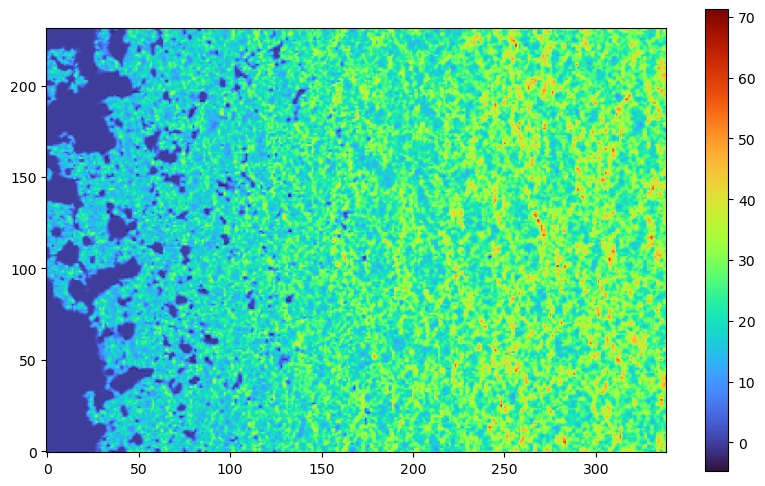

In [135]:
fig,ax = plt.subplots(figsize=(10,6))
p0 = ax.imshow(lc_data[60,:,:],origin='lower',cmap='turbo')
fig.colorbar(p0)

In [136]:
mean_map=np.zeros([232,232,339])
mean_array=np.array([])
for i in range (lc_data.shape[2]):
    mean=np.mean(lc_data[:,:,i])
    mean_array=np.append(mean_array,mean)
    mean_map[:,:,i]=mean

mean_map.shape


(232, 232, 339)

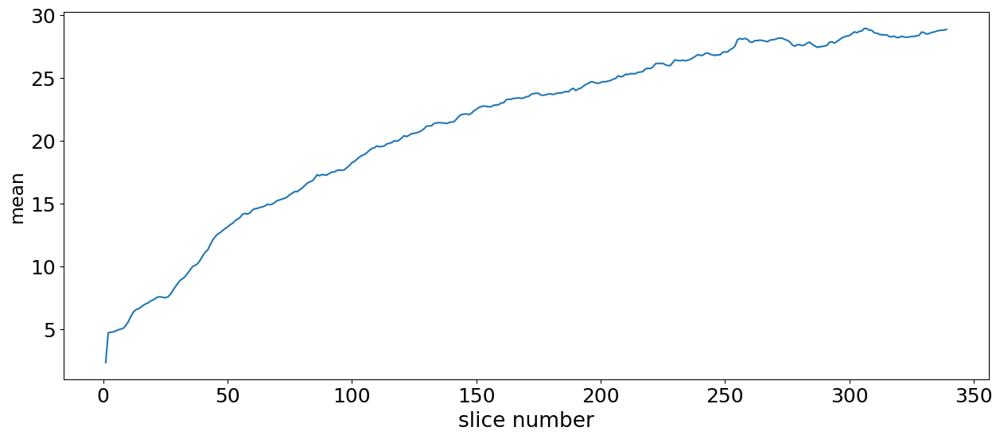

In [137]:
slice_number=np.arange(1,340,1)
fig,ax = plt.subplots(figsize=(15,6))
plt.xlabel("slice number",fontsize='19')
plt.ylabel("mean",fontsize='17')
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.plot(slice_number,mean_array)

In [138]:
mean_sub_map=lc_data-mean_map

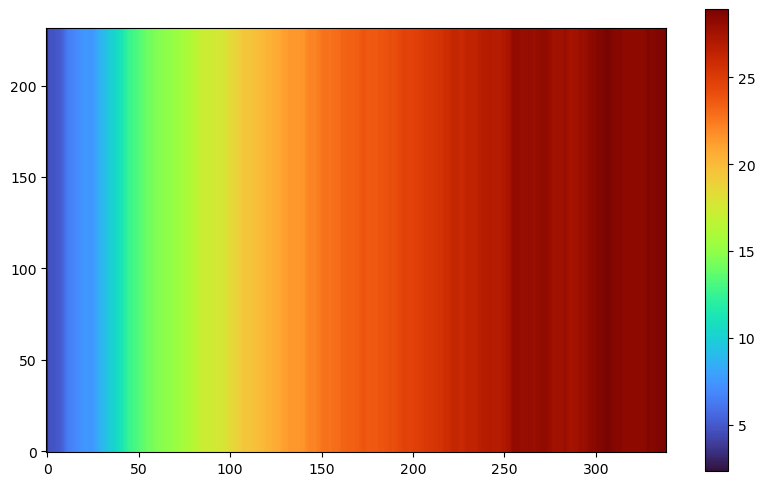

In [139]:
fig,ax = plt.subplots(figsize=(10,6))
p0 = ax.imshow(mean_map[x,:,:],origin='lower',cmap='turbo')
fig.colorbar(p0)

In [231]:
x=80

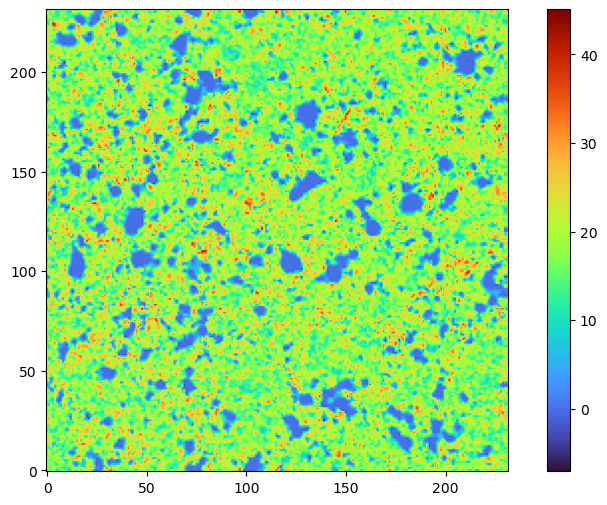

In [232]:
fig,ax = plt.subplots(figsize=(10,6))
p0 = ax.imshow(lc_data[:,:,x],origin='lower',cmap='turbo')
fig.colorbar(p0)

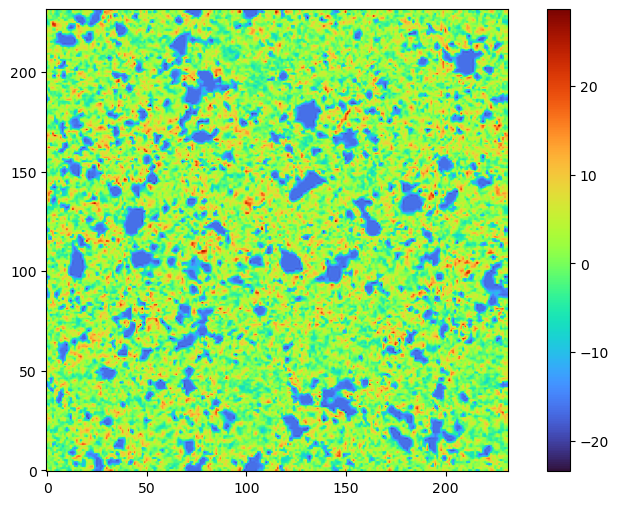

In [233]:
fig,ax = plt.subplots(figsize=(10,6))
p0 = ax.imshow(mean_sub_map[:,:,x],origin='lower',cmap="turbo")
fig.colorbar(p0)

In [218]:
x=80

/tmp/ipykernel_4322/4277010718.py:9: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax[2] = plt.subplot(1, 3, 3, sharex=ax[0], sharey=ax[0])


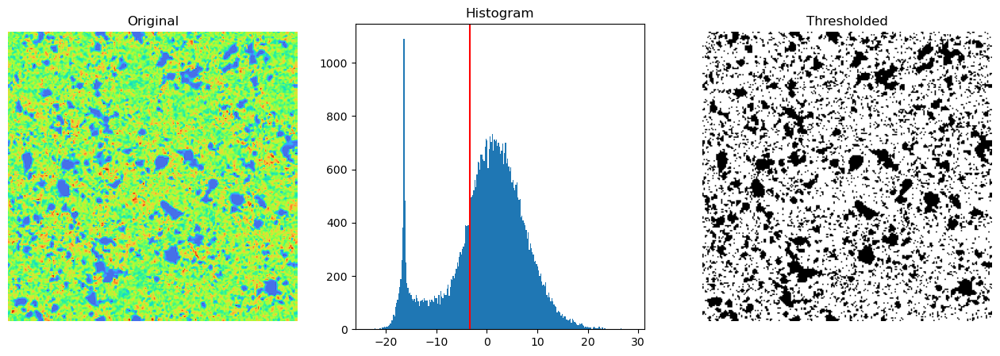

In [219]:
image=mean_sub_map[:,:,x:x+1]
thresh = threshold_otsu(image)
binary = image > thresh

fig, axes = plt.subplots(ncols=3, figsize=(16,5))
ax = axes.ravel()
ax[0] = plt.subplot(1, 3, 1)
ax[1] = plt.subplot(1, 3, 2)
ax[2] = plt.subplot(1, 3, 3, sharex=ax[0], sharey=ax[0])

ax[0].imshow(image, cmap="turbo")
ax[0].set_title('Original')
ax[0].axis('off')

ax[1].hist(image.ravel(), bins=256)
ax[1].set_title('Histogram')
ax[1].axvline(thresh, color='r')

ax[2].imshow(binary, cmap=plt.cm.gray)
ax[2].set_title('Thresholded')
ax[2].axis('off')

plt.show()

/tmp/ipykernel_4322/3425512799.py:9: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax[2] = plt.subplot(1, 3, 3, sharex=ax[0], sharey=ax[0])


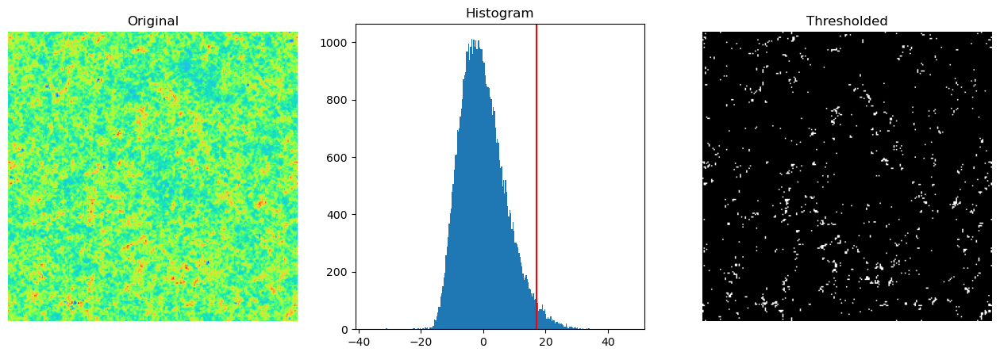

In [234]:
image=mean_sub_map[:,:,220]
thresh = threshold_triangle(image)
binary = image > thresh

fig, axes = plt.subplots(ncols=3, figsize=(16,5))
ax = axes.ravel()
ax[0] = plt.subplot(1, 3, 1)
ax[1] = plt.subplot(1, 3, 2)
ax[2] = plt.subplot(1, 3, 3, sharex=ax[0], sharey=ax[0])

ax[0].imshow(image, cmap="turbo")
ax[0].set_title('Original')
ax[0].axis('off')

ax[1].hist(image.ravel(), bins=256)
ax[1].set_title('Histogram')
ax[1].axvline(thresh, color='r')

ax[2].imshow(binary, cmap=plt.cm.gray)
ax[2].set_title('Thresholded')
ax[2].axis('off')

plt.show()

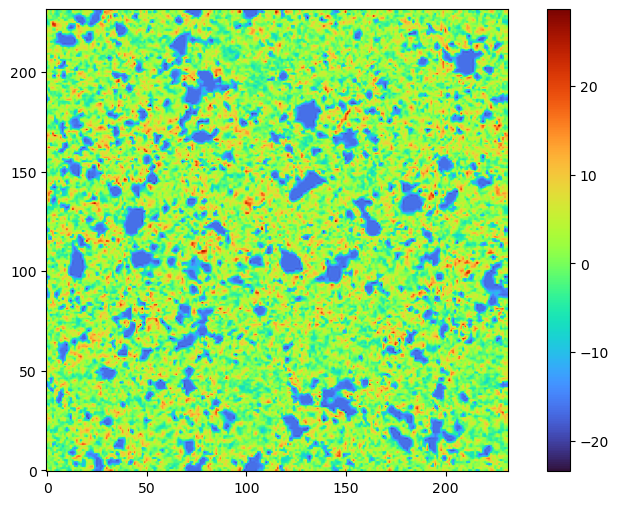

In [223]:
fig,ax = plt.subplots(figsize=(10,6))
p0 = ax.imshow(image,origin='lower',cmap='turbo')
fig.colorbar(p0)

/tmp/ipykernel_4322/1659613451.py:9: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax[2] = plt.subplot(1, 3, 3, sharex=ax[0], sharey=ax[0])


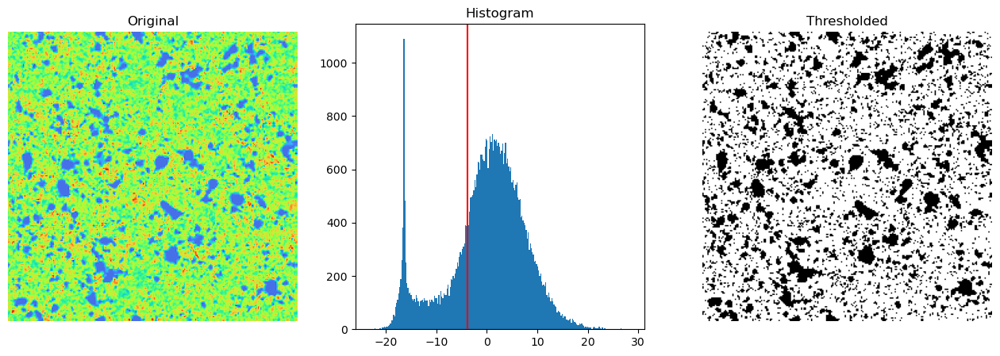

In [221]:
image=mean_sub_map[:,:,x]
thresh = threshold_isodata(image)
binary = image > thresh

fig, axes = plt.subplots(ncols=3, figsize=(16,5))
ax = axes.ravel()
ax[0] = plt.subplot(1, 3, 1)
ax[1] = plt.subplot(1, 3, 2)
ax[2] = plt.subplot(1, 3, 3, sharex=ax[0], sharey=ax[0])

ax[0].imshow(image, cmap="turbo")
ax[0].set_title('Original')
ax[0].axis('off')

ax[1].hist(image.ravel(), bins=256)
ax[1].set_title('Histogram')
ax[1].axvline(thresh, color='r')

ax[2].imshow(binary, cmap=plt.cm.gray)
ax[2].set_title('Thresholded')
ax[2].axis('off')

plt.show()

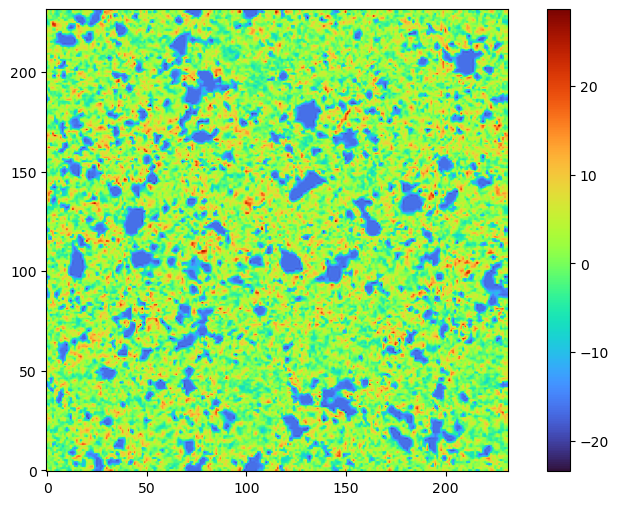

In [222]:
fig,ax = plt.subplots(figsize=(10,6))
p0 = ax.imshow(image,origin='lower',cmap='turbo')
fig.colorbar(p0)

/tmp/ipykernel_4322/2984324802.py:9: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax[2] = plt.subplot(1, 3, 3, sharex=ax[0], sharey=ax[0])


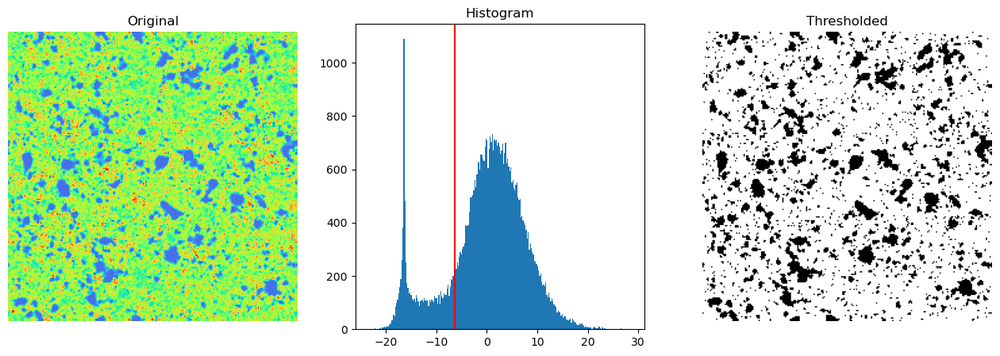

In [204]:
image=mean_sub_map[:,:,x]
thresh = threshold_li(image)
binary = image > thresh

fig, axes = plt.subplots(ncols=3, figsize=(16,5))
ax = axes.ravel()
ax[0] = plt.subplot(1, 3, 1)
ax[1] = plt.subplot(1, 3, 2)
ax[2] = plt.subplot(1, 3, 3, sharex=ax[0], sharey=ax[0])

ax[0].imshow(image, cmap="turbo")
ax[0].set_title('Original')
ax[0].axis('off')

ax[1].hist(image.ravel(), bins=256)
ax[1].set_title('Histogram')
ax[1].axvline(thresh, color='r')

ax[2].imshow(binary, cmap=plt.cm.gray)
ax[2].set_title('Thresholded')
ax[2].axis('off')

plt.show()

/tmp/ipykernel_4322/3280504743.py:9: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax[2] = plt.subplot(1, 3, 3, sharex=ax[0], sharey=ax[0])


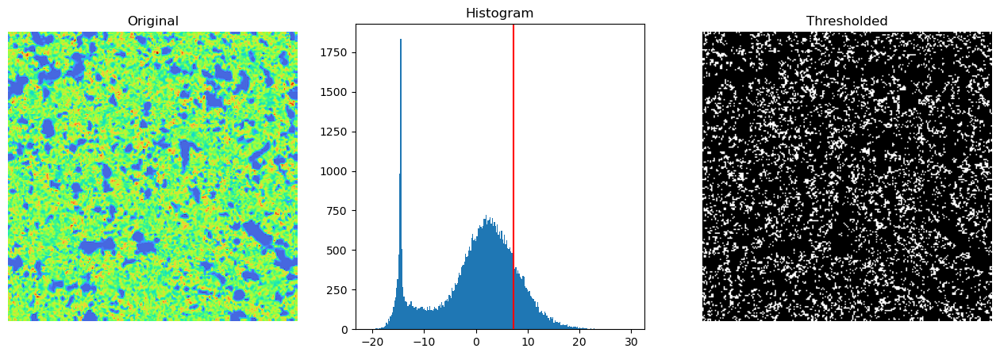

In [205]:
image=mean_sub_map[:,:,60]
thresh = threshold_yen(image)
binary = image > thresh

fig, axes = plt.subplots(ncols=3, figsize=(16,5))
ax = axes.ravel()
ax[0] = plt.subplot(1, 3, 1)
ax[1] = plt.subplot(1, 3, 2)
ax[2] = plt.subplot(1, 3, 3, sharex=ax[0], sharey=ax[0])

ax[0].imshow(image, cmap="turbo")
ax[0].set_title('Original')
ax[0].axis('off')

ax[1].hist(image.ravel(), bins=256)
ax[1].set_title('Histogram')
ax[1].axvline(thresh, color='r')

ax[2].imshow(binary, cmap=plt.cm.gray)
ax[2].set_title('Thresholded')
ax[2].axis('off')

plt.show()

/tmp/ipykernel_4322/925034963.py:9: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax[2] = plt.subplot(1, 3, 3, sharex=ax[0], sharey=ax[0])


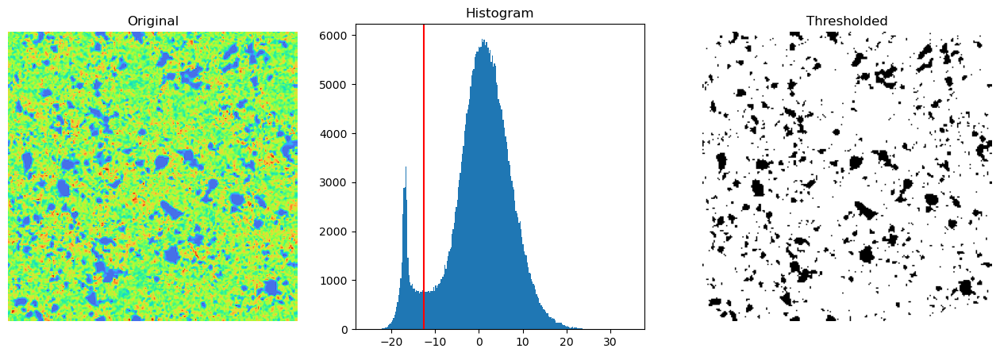

In [237]:
image=mean_sub_map[:,:,x:x+7]
thresh = threshold_minimum(image)
binary = image > thresh

fig, axes = plt.subplots(ncols=3, figsize=(16,5))
ax = axes.ravel()
ax[0] = plt.subplot(1, 3, 1)
ax[1] = plt.subplot(1, 3, 2)
ax[2] = plt.subplot(1, 3, 3, sharex=ax[0], sharey=ax[0])

ax[0].imshow(image[:,:,0], cmap="turbo")
ax[0].set_title('Original')
ax[0].axis('off')

ax[1].hist(image.ravel(), bins=256)
ax[1].set_title('Histogram')
ax[1].axvline(thresh, color='r')

ax[2].imshow(binary[:,:,0], cmap=plt.cm.gray)
ax[2].set_title('Thresholded')
ax[2].axis('off')

plt.show()

In [208]:
x=10





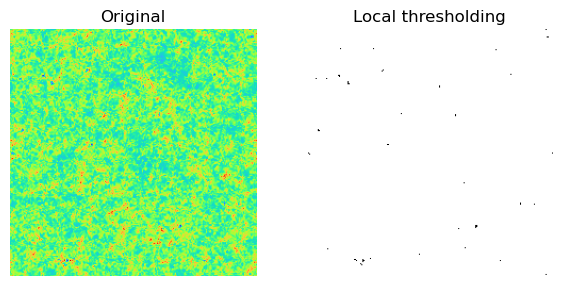

In [151]:
block_size = 35
image=mean_sub_map[:,:,220]
local_thresh = threshold_local(image, block_size, offset=20)
binary_local = image > local_thresh

fig, axes = plt.subplots(ncols=2, figsize=(7, 8))
ax = axes.ravel()
plt.gray()

ax[0].imshow(image,cmap="turbo")
ax[0].set_title('Original')

ax[1].imshow(binary_local)
ax[1].set_title('Local thresholding')

for a in ax:
    a.set_axis_off()

plt.show()

# OTSU

In [46]:
def binary_image_otsu(image):
        thresh = threshold_otsu(image)
        binary = image > thresh
        return binary

    

In [47]:
b_image_arr_otsu=[]
for i in range (lc_data.shape[2]):
    b_image=binary_image_otsu(lc_data[:,:,i])
    b_image_arr_otsu.append(b_image)
    
b_image_arr_otsu=np.array(b_image_arr_otsu)
b_image_arr_otsu=np.transpose(b_image_arr_otsu,axes=(1,2,0))
b_image_arr_otsu.shape

(232, 232, 339)

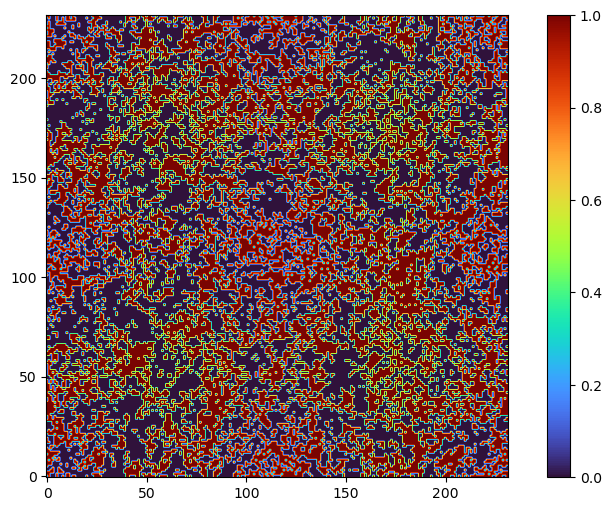

In [48]:
fig,ax = plt.subplots(figsize=(10,6))
p0 = ax.imshow(b_image_arr_otsu[:,:,x],origin='lower',cmap='turbo')
fig.colorbar(p0)

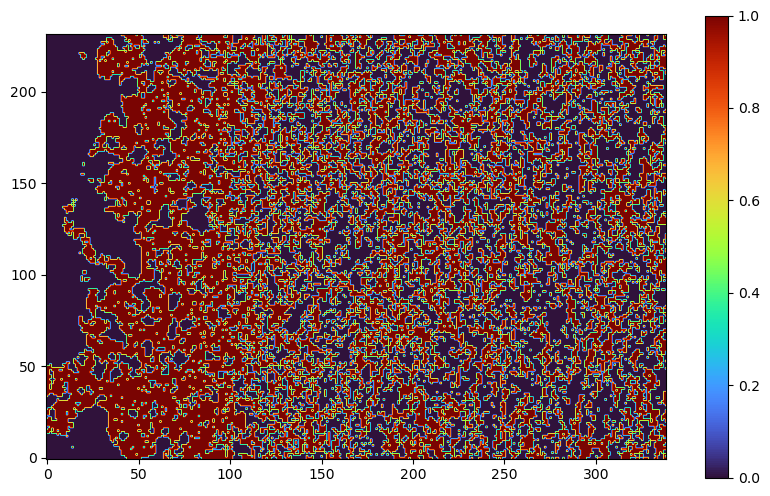

In [49]:
fig,ax = plt.subplots(figsize=(10,6))
p0 = ax.imshow(b_image_arr_otsu[x,:,:],origin='lower',cmap='turbo')
fig.colorbar(p0)

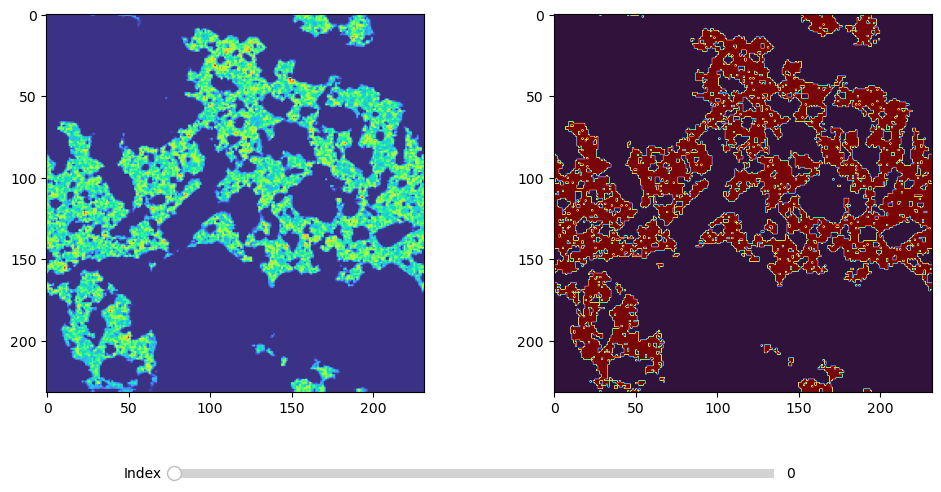

In [51]:
# Initial index
initial_index = 0

# Create a figure and two subplots side by side
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

# Display initial images
img1 = ax1.imshow(mean_sub_map[:,:,initial_index], cmap='turbo')
img2 = ax2.imshow(b_image_arr_otsu[:,:,initial_index], cmap='turbo')

# Adjust the main plot to make room for the sliders
plt.subplots_adjust(bottom=0.25)

# Add a slider axis below the plots
ax_slider = plt.axes([0.25, 0.1, 0.5, 0.03], facecolor='lightgoldenrodyellow')

# Create the slider
slider = Slider(ax=ax_slider, label='Index', valmin=0, valmax=data1.shape[0] - 1, valinit=initial_index, valstep=1)

# Update function to change the images
def update(val):
    index = int(slider.val)
    img1.set_data(mean_sub_map[index, :, :])
    img2.set_data(b_image_arr_otsu[index, :, :])
    fig.canvas.draw_idle()

# Connect the slider to the update function
slider.on_changed(update)

# Display the plot
plt.show()




## Minimum

In [181]:
def binary_image_triangle(image):
        thresh = threshold_triangle(image)
        binary = image > thresh
        return binary


In [189]:
b_image_arr_triangle=[]
for i in range (lc_data.shape[2]):
    b_image=binary_image_triangle(mean_sub_map[:,:,i:i+3])
    b_image_arr_triangle.append(b_image[:,:,0])
    print(i)
    
b_image_arr_triangle=np.array(b_image_arr_triangle)
b_image_arr_triangle=np.transpose(b_image_arr_triangle,axes=(1,2,0))
b_image_arr_triangle.shape

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

(232, 232, 339)

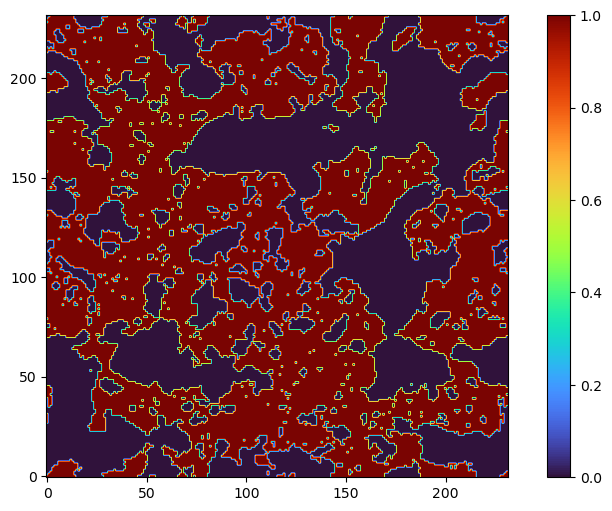

In [190]:
fig,ax = plt.subplots(figsize=(10,6))
p0 = ax.imshow(b_image_arr_triangle[:,:,22],origin='lower',cmap='turbo')
fig.colorbar(p0)

In [99]:
def ang_res(comoving_resolution,z):
    delta_theta=comoving_resolution/(WMAP5.comoving_distance(z).value)
    return delta_theta
def lamda_obs(z):
    l_obs=(300*(1+z))/1420
    return l_obs
def k_perp(comoving_resolution,z):
    u_max=1/ang_res(comoving_resolution,z)
    k_p = 2*np.pi*u_max/(WMAP5.comoving_distance(z).value)
    return k_p
    

In [100]:
comoving_resolution=3
z=n_fraction[170,0]
A_eff  = 962 # m^2
A_core  = np.pi*(2e3)**2 # m^2
A_coll = 350* A_eff # N_stat  =  ?
Omega_FOV = (lamda_obs(z)**2)/A_eff
nu = 1420/(z+1)
T_sys = 180*(nu/180)**(-2.6) + 40
B = 16e6 # 16 MHz
t_int = 1000*3600 

In [101]:
n_fraction[170,0]

8.996202261332272

In [102]:
np.var(lc_data[:,:,170])

37.634865

In [103]:
delta_T  = (k_perp(comoving_resolution,z)/(2*np.pi))*((WMAP5.comoving_distance(z).value)**2*Omega_FOV)**(0.5)*(T_sys/np.sqrt(B*t_int))*np.sqrt(A_core*A_eff/A_coll**2)

In [104]:
print(f"{delta_T*1e3} mK")

3.4404156650211326 mK


In [105]:
x=50

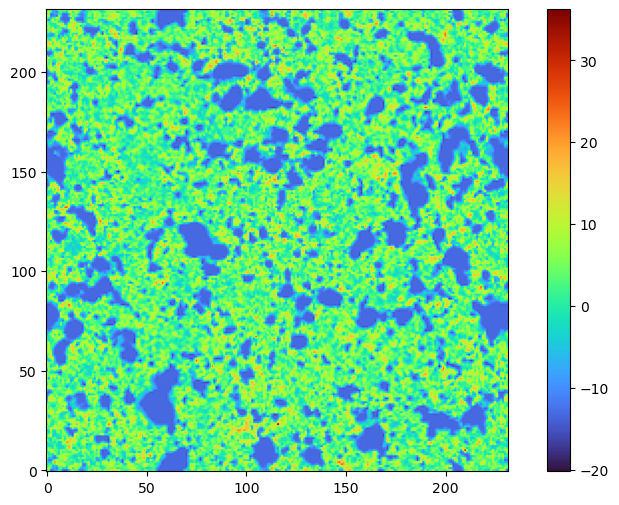

In [106]:
fig,ax = plt.subplots(figsize=(10,6))
p0 = ax.imshow(mean_sub_map[:,:,x],origin='lower',cmap='turbo')
fig.colorbar(p0)

50


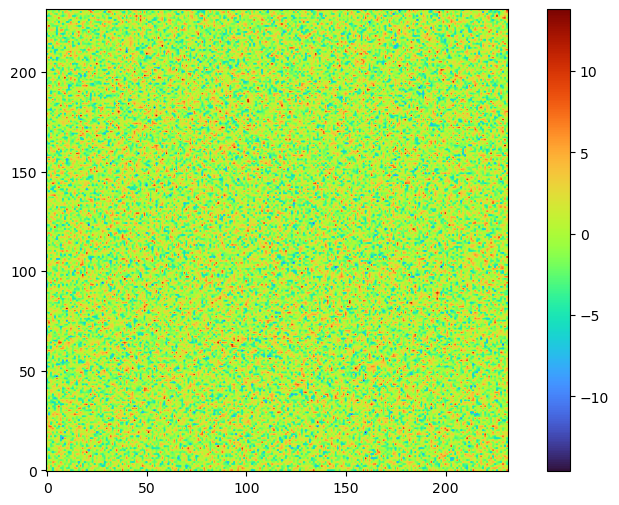

In [107]:
noise=np.random.normal(0,delta_T*1e3,size=(232,232,339))
# fig,ax = plt.subplots(figsize=(10,6))
# p0 = ax.imshow(noise[10,:,:],origin='lower',cmap='turbo',vmin=0,vmax=50)
# fig.colorbar(p0)
#x=np.random.randint(339)
fig,ax = plt.subplots(figsize=(10,6))
p0 = ax.imshow(noise[:,:,x],origin='lower',cmap='turbo')
fig.colorbar(p0)
print(x)


50


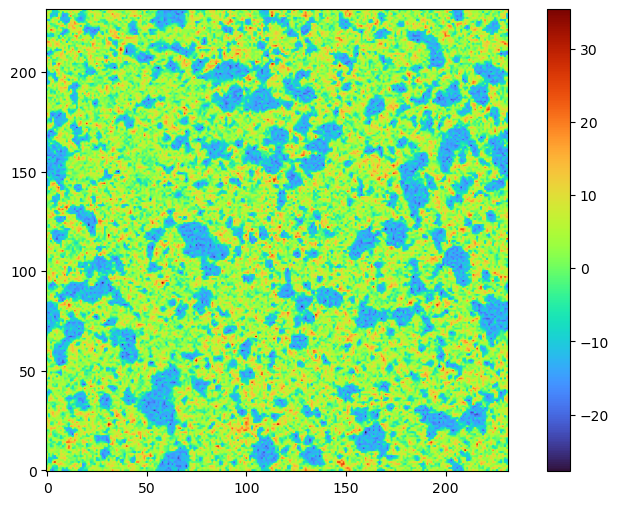

In [108]:

noise_map=mean_sub_map+noise
fig,ax = plt.subplots(figsize=(10,6))
p0 = ax.imshow(noise_map[:,:,x],origin='lower',cmap='turbo')
fig.colorbar(p0)
print(x)


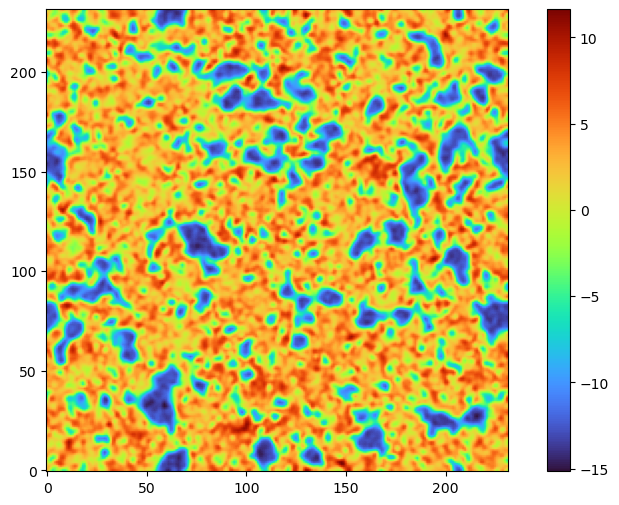

In [109]:
conv_noise_map=ndimage.gaussian_filter(noise_map, sigma=1)
fig,ax = plt.subplots(figsize=(10,6))
p0 = ax.imshow(conv_noise_map[:,:,x],origin='lower',cmap='turbo')
fig.colorbar(p0)

In [130]:
b_image_arr_minimum=[]
for i in range (lc_data.shape[2]):
        b_image=binary_image_minimum(conv_noise_map[:,:,i])
        b_image_arr_minimum.append(b_image)
        print(i)
    
b_image_arr_minimum=np.array(b_image_arr_minimum)
b_image_arr_minimum=np.transpose(b_image_arr_minimum,axes=(1,2,0))
b_image_arr_minimum.shape

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
93
94
95
96
97
98
99
100
102
103
104
105
106
107
108
109
111
112
113
114
115
116
117
118
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
203
204
205
206
207
208
209
210
212
213
214
215
216
217
218
219
220
221
222
223
225
226
227
228
229
231
232
234
235
236
237
238


RuntimeError: Unable to find two maxima in histogram

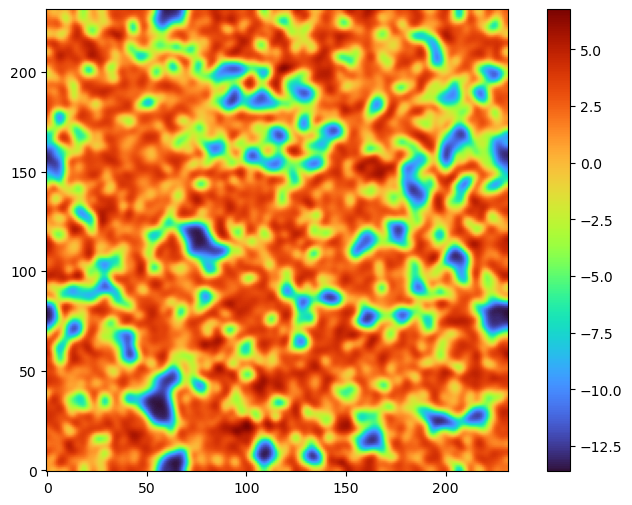

In [85]:
conv_noise_map=ndimage.gaussian_filter(noise_map, sigma=2)
fig,ax = plt.subplots(figsize=(10,6))
p0 = ax.imshow(conv_noise_map[:,:,x],origin='lower',cmap='turbo')
fig.colorbar(p0)


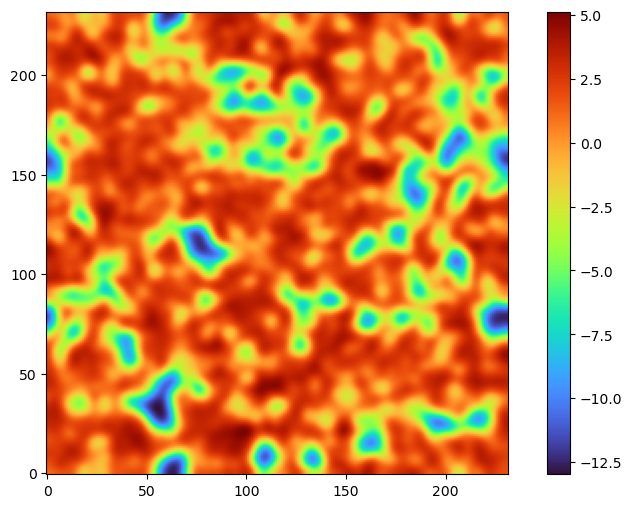

In [89]:
conv_noise_map=ndimage.gaussian_filter(noise_map, sigma=3)
fig,ax = plt.subplots(figsize=(10,6))
p0 = ax.imshow(conv_noise_map[:,:,x],origin='lower',cmap='turbo')
fig.colorbar(p0)


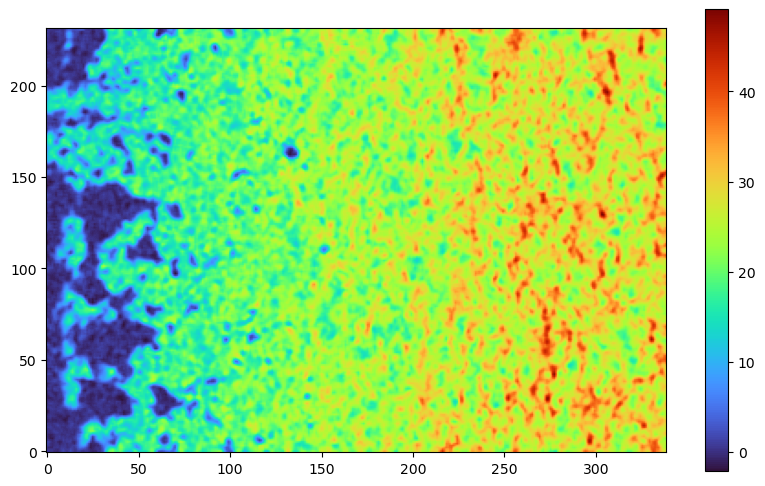

In [70]:
conv_noise_map=ndimage.gaussian_filter(noise_map, sigma=(2,2,2),order=0,radius=(1,1,1))
fig,ax = plt.subplots(figsize=(10,6))
p0 = ax.imshow(conv_noise_map[5,:,:],origin='lower',cmap='turbo')
fig.colorbar(p0)

In [5]:
def chunk(chunk_size,chunk_inumber):
    if chunk_inumber+chunk_size<=339:
        a = n_fraction[chunk_inumber,:]
        b = n_fraction[(chunk_inumber+chunk_size),:]
        z_avg= (a[0]+b[0])/2
        xn_avg=1-np.mean([a[1],b[1]])
        print(z_avg,xn_avg)
    
        #print(chunk_data)
        #print(chunk_data.shape)
    
        #print(dl.dtype)
        #print(chunk_data)
    
        light_cone1=lc_data[:,:,chunk_inumber:(chunk_size+chunk_inumber)]
        #print(light_cone1.shape)
        #print (light_cone1)
    
        #chunk_inumber=chunk_inumber+chunk_size
        print(chunk_inumber)
        #fig,ax = plt.subplots()
        #p0 = ax.imshow(light_cone1[10,:,:],origin='lower',cmap='turbo')
        #ax.invert_xaxis()
        #fig.colorbar(p0)
        #print(light_cone1.dtype)
        #print(light_cone1.shape)
        #print(light_cone1)
#     else:
        
#         a = n_fraction[chunk_inumber,:]
#         b = n_fraction[339,:]
#         z_avg= (a[0]+b[0])/2
#         xn_avg=1-np.mean([a[1],b[1]])
#         print(z_avg,xn_avg)
    
#         #print(chunk_data)
#         #print(chunk_data.shape)
    
#         #print(dl.dtype)
#         #print(chunk_data)
    
#         light_cone1=lc_data[:,:,chunk_inumber:339]
#         #print(light_cone1.shape)
#         #print (light_cone1)
    
#         #chunk_inumber=chunk_inumber+chunk_size
#         print(chunk_inumber)
#         #fig,ax = plt.subplots()
#         #p0 = ax.imshow(light_cone1[10,:,:],origin='lower',cmap='turbo')
#         #ax.invert_xaxis()
#         #fig.colorbar(p0)
#         #print(light_cone1.dtype)
#         #print(light_cone1.shape)
#         #print(light_cone1)
     
    return light_cone1,chunk_inumber,z_avg,xn_avg
     

In [6]:
def fcone(lightcone,z_avg,i):
    #print(light_cone1.dtype)
    shape=np.array([])
    #chunk(30,0).shape
    shape=np.array(lightcone.shape)
    #chunk(30,0)
    print(shape)
    #print(light_cone1)
    light_cone1 = lightcone.reshape (shape[0]*shape[1]*shape[2], order='C')
    
    def binarylcmap(np_lcmap,filename):
        with open(filename,"wb") as f:
            f.write(np.array(shape[0],dtype=np.uint32))
            f.write(np.array(shape[1],dtype=np.uint32))
            f.write(np.array(shape[2],dtype=np.uint32))
            data=np_lcmap.tobytes()
            f.write(data)
            
    #binarylcmap(light_cone1,"lc%d.cbin"%i)
    
    return
            
    
    


In [7]:
z_array=np.array([])
xn_array=np.array([])

In [8]:
n=60                                        #chunk_size
for i in range(0,340,1):                 #i=chunk_initial_number
    lc=0
    lc=chunk(n,i)
    fcone(lc[0],lc[2],i)
    z_array=np.append(z_array,lc[2])
    xn_array=np.append(xn_array,lc[3])


7.533932139552935 0.40038960180018957
0
[232 232  60]
7.5432657228418165 0.399365392759063
1
[232 232  60]
7.552614564434748 0.39984890505756376
2
[232 232  60]
7.561978697238374 0.40039054583689504
3
[232 232  60]
7.571358154300155 0.4028694278253848
4
[232 232  60]
7.5807529692292945 0.40351236210742236
5
[232 232  60]
7.590163175775035 0.40454588070520414
6
[232 232  60]
7.599588807686623 0.408805654216851
7
[232 232  60]
7.609029898847426 0.414330809949502
8
[232 232  60]
7.618486483662183 0.4219131746079907
9
[232 232  60]
7.627958596662303 0.4324175065861068
10
[232 232  60]
7.637446272379204 0.43728665164680514
11
[232 232  60]
7.646949545344295 0.4386191176481622
12
[232 232  60]
7.656468450088989 0.44246098065815787
13
[232 232  60]
7.666003021144701 0.45057623712797734
14
[232 232  60]
7.675553293042844 0.45582759024865793
15
[232 232  60]
7.685119300314829 0.4614661503969836
16
[232 232  60]
7.69470107749207 0.46484667853269823
17
[232 232  60]
7.704298659105978 0.4735812437

9.357692220166907 0.9212727001402621
169
[232 232  60]
9.37016252856894 0.9245764074883918
170
[232 232  60]
9.382655323990072 0.9261993051670088
171
[232 232  60]
9.395170660278211 0.9258249038194387
172
[232 232  60]
9.40770859199284 0.9254951623914773
173
[232 232  60]
9.42026917406315 0.9288907340014583
174
[232 232  60]
9.432852461421506 0.9294717912712098
175
[232 232  60]
9.445458509000257 0.9283764054573136
176
[232 232  60]
9.458087371731764 0.9300286784162008
177
[232 232  60]
9.470739104548379 0.9313861010404487
178
[232 232  60]
9.483413762382465 0.9332849620858441
179
[232 232  60]
9.496111400166374 0.9328048528181833
180
[232 232  60]
9.50883207285015 0.9345727843476863
181
[232 232  60]
9.521575836080922 0.9375907172158855
182
[232 232  60]
9.534342746416737 0.9381086168220178
183
[232 232  60]
9.54713286047707 0.9403835287565037
184
[232 232  60]
9.559946234881398 0.9398017534844212
185
[232 232  60]
9.572782926249197 0.9399995707837082
186
[232 232  60]
9.5856429911999

UnboundLocalError: local variable 'light_cone1' referenced before assignment